In [3]:
import sys 
sys.path.append('/ai-data/chest/kjs2109/baseline/detectron2-baseline') 
print(sys.path)
from inference.inference_model import InferenceModel 

['/ai-data/chest/kjs2109/baseline/detectron2-baseline/test', '/home/kjs2109/.conda/envs/deepai-kjs/lib/python39.zip', '/home/kjs2109/.conda/envs/deepai-kjs/lib/python3.9', '/home/kjs2109/.conda/envs/deepai-kjs/lib/python3.9/lib-dynload', '', '/home/kjs2109/.local/lib/python3.9/site-packages', '/home/kjs2109/.conda/envs/deepai-kjs/lib/python3.9/site-packages', '/ai-data/env_setup/detectron2', '/ai-data/chest/kjs2109/baseline/detectron2-baseline', '/ai-data/chest/kjs2109/baseline/detectron2-baseline']


In [4]:
import torch 

CONFIG_DICT = {
    'weight_path': '/ai-data/chest/kjs2109/baseline/detectron2-baseline/weight_dir/MRCNN/MRCNN_BORA_EVAL_5Findings_1gpus_512bs_8workers_MRCNN_1024_0.0001LR_WCLR_mask_rcnn_R_50_FPN_3x_gn/MRCNN_5cls_trial26.pth', 
    'model_zoo_config': 'Misc/mask_rcnn_R_50_FPN_3x_gn.yaml',
    'input_min_size_test': 1024, 
    'input_max_size_test': 1024, 
    'model_roi_heads_batch': 512, 
    'model_roi_heads_threshold': 0.5,
    'CLASSES': ['Consolidation', 'Pneumothorax', 'Fibrosis', 'Effusion', 'Nodule'], 
    'device': 'cuda' if torch.cuda.is_available() else 'cpu' 
} 

MRCNN_R_50_model = InferenceModel(CONFIG_DICT) 
MRCNN_R_50_model 

In [5]:
from inference.inference_model import plot_inference_result 

In [8]:
import pandas as pd 

total_image_df = pd.read_csv('/ai-data/chest/kjs2109/private_data/total_image_df_v1.csv') 
print(len(total_image_df))

over_5_disease_df = pd.read_csv('/ai-data/chest/kjs2109/private_data/over_5_disease_df.csv')
print(len(over_5_disease_df)) 

64852
487


In [9]:
target_classes = MRCNN_R_50_model.target_classes 
target_classes 

['Consolidation', 'Pneumothorax', 'Fibrosis', 'Effusion', 'Nodule']

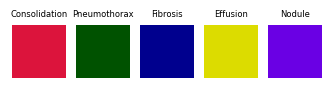

In [10]:
import matplotlib.pyplot as plt  
import numpy as np 

plt.figure(figsize=(4, 20)) 
for i, color in enumerate(MRCNN_R_50_model.PALETTE): 
    plt.subplot(1, 5, i+1)
    plt.imshow(np.ones((10, 10, 3), dtype=np.uint8) * color)
    plt.title(target_classes[i], fontsize=6)
    plt.axis('off') 

  0%|          | 0/9 [00:00<?, ?it/s]/home/kjs2109/.conda/envs/deepai-kjs/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


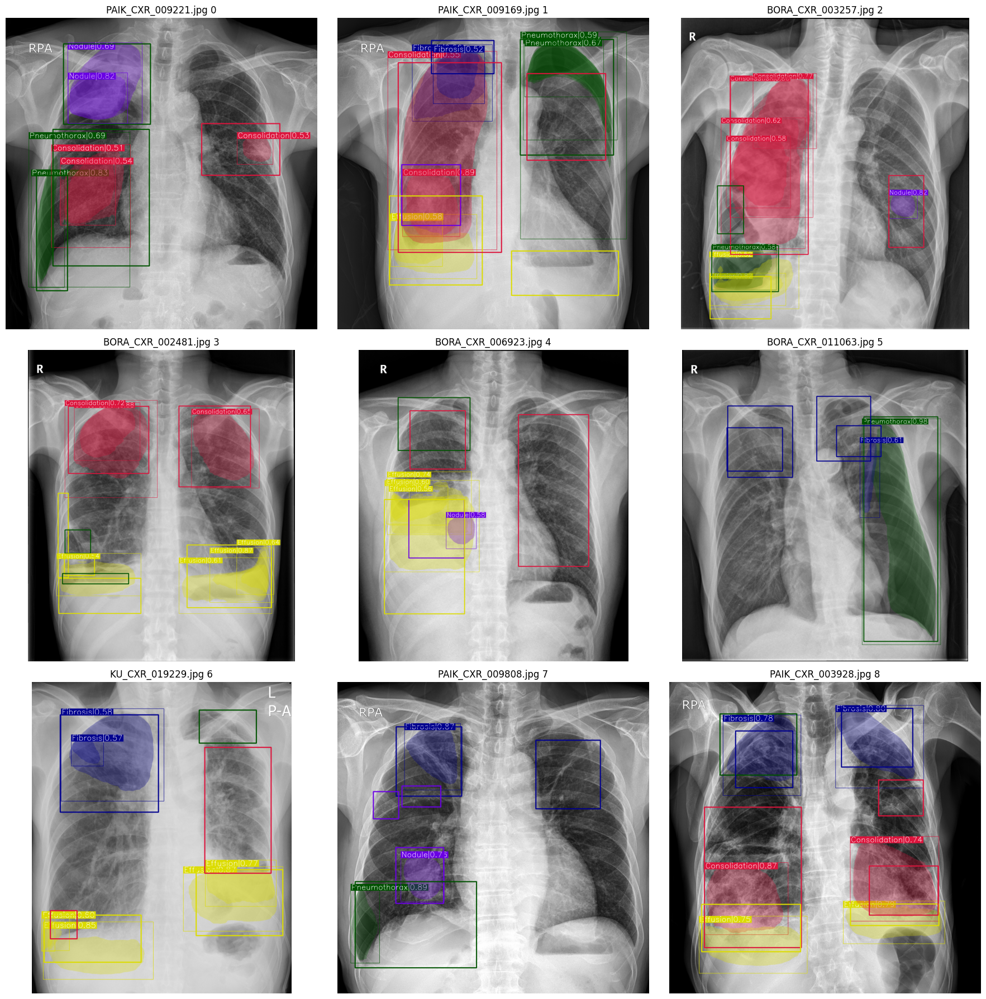

In [11]:
import random 
import pandas as pd 

 
pneumothorax_df = over_5_disease_df[over_5_disease_df['pneumothorax'] >= 1]  

random.seed(42)               
image_fnames = random.sample(list(pneumothorax_df['image_fname']), 9) 

plot_inference_result(MRCNN_R_50_model, image_fnames, gt=True, mode=['mask', 'box'], threshold=0.5) 

100%|██████████| 9/9 [00:09<00:00,  1.05s/it]


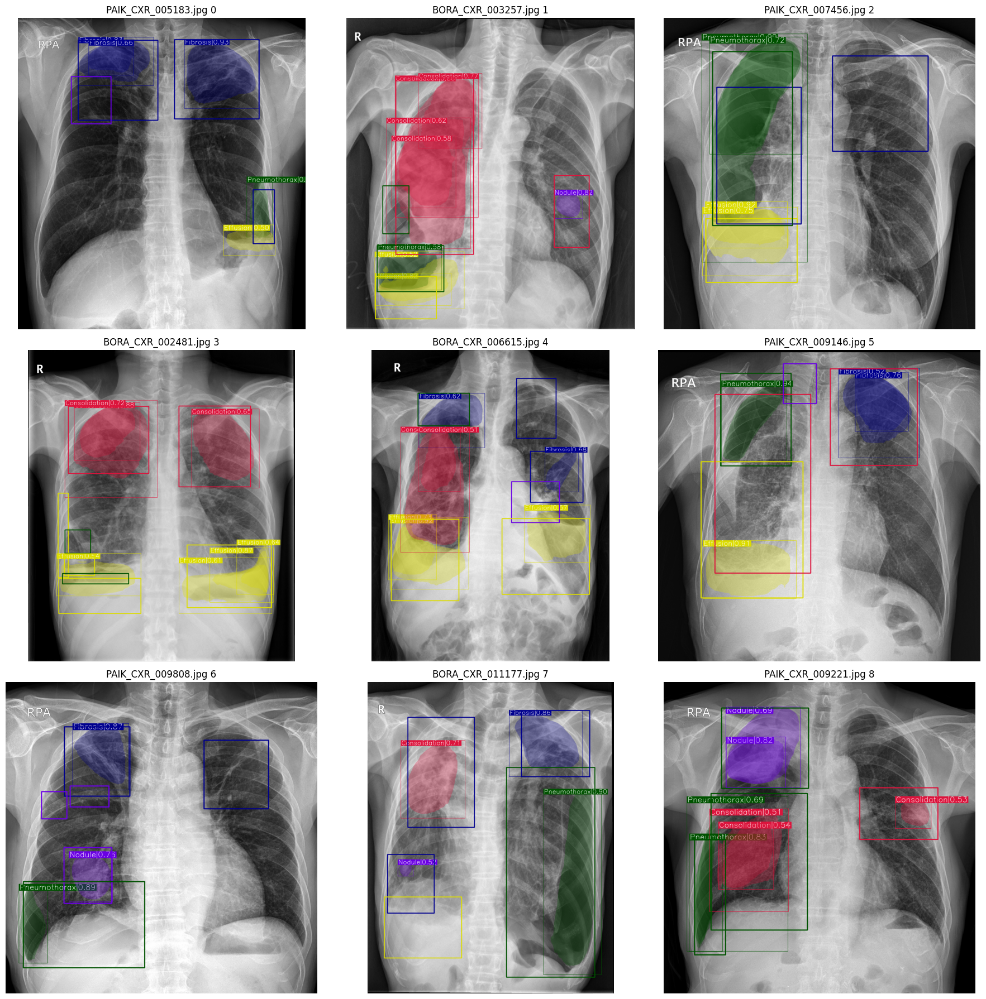

In [12]:
random.seed(50)               
image_fnames = random.sample(list(pneumothorax_df['image_fname']), 9) 

plot_inference_result(MRCNN_R_50_model, image_fnames, gt=True, mode=['mask', 'box'], threshold=0.5)

100%|██████████| 9/9 [00:05<00:00,  1.75it/s]


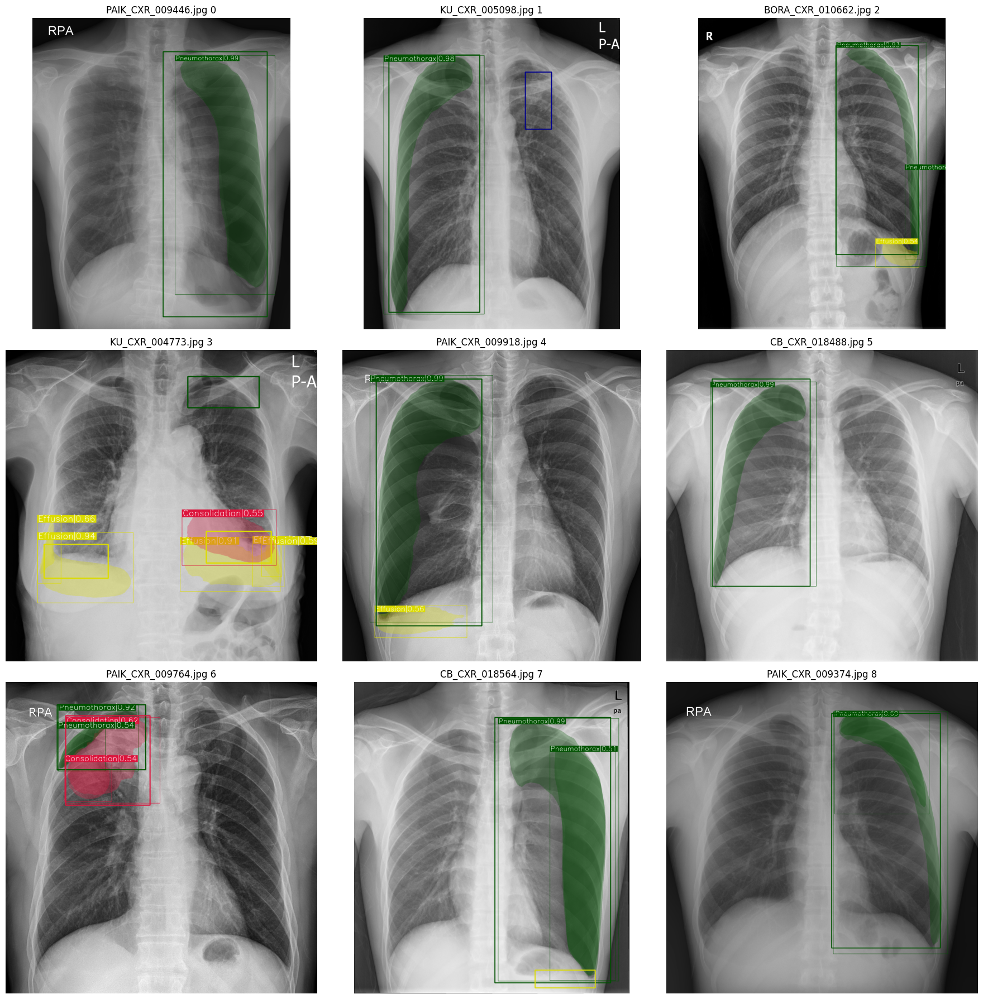

In [14]:
random.seed(42)               
total_pneumothorax_df = total_image_df[total_image_df['pneumothorax'] >= 1]  
image_fnames = random.sample(list(total_pneumothorax_df['image_fname']), 9) 

plot_inference_result(MRCNN_R_50_model, image_fnames, gt=True, mode=['mask', 'box'], threshold=0.5) 


100%|██████████| 9/9 [00:08<00:00,  1.11it/s]


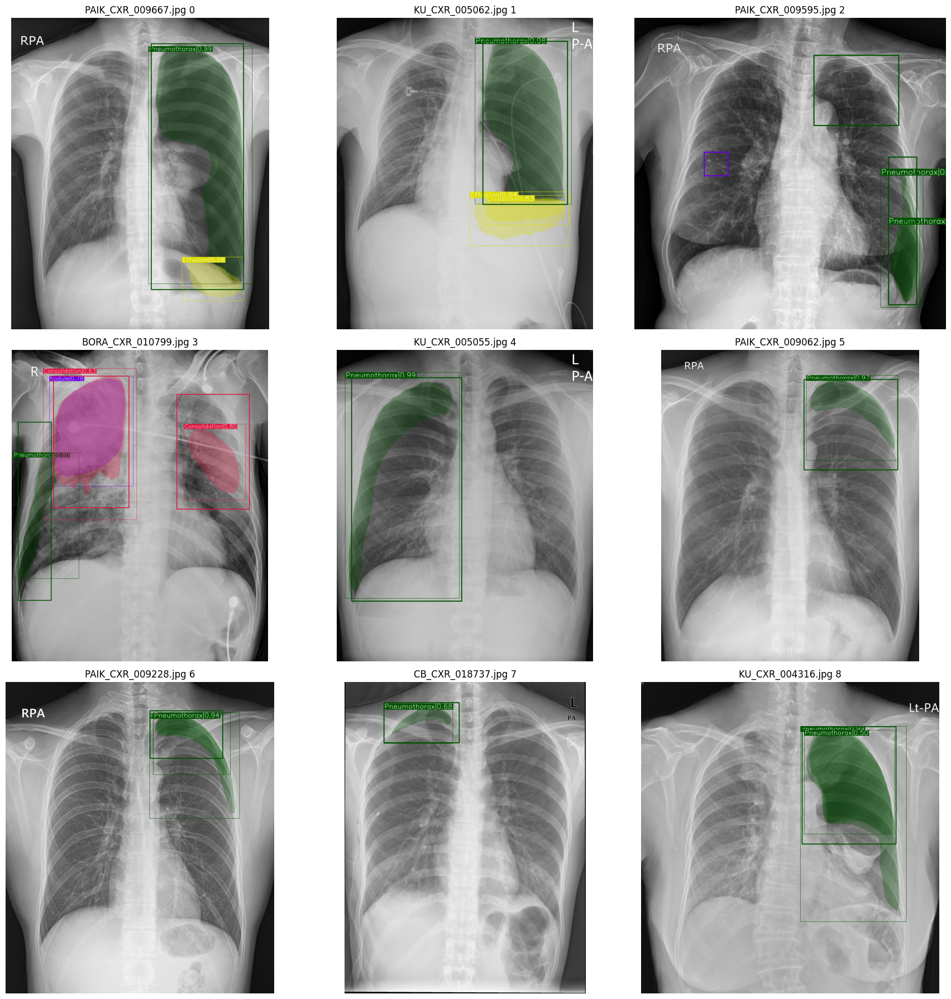

In [13]:
random.seed(50)               
total_pneumothorax_df = total_image_df[total_image_df['pneumothorax'] >= 1]  
image_fnames = random.sample(list(total_pneumothorax_df['image_fname']), 9) 

plot_inference_result(MRCNN_R_50_model, image_fnames, gt=True, mode=['mask', 'box'], threshold=0.5) 